In [1]:
%matplotlib ipympl

import inspect
import os
import h5py
import numpy as np
import matplotlib.pyplot as plt
import re

from pathlib import Path
from colorama import Fore, Style
from SWAXSanalysis.class_nexus_file import NexusFile, save_data
from smi_analysis import SMI_beamline

  File "C:\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "C:\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\AT280565\Desktop\Data Treatment Center\Jupyter notebooks\.venv\lib\site-packages\ipykernel_launcher.py", line 18, in <module>
    app.launch_new_instance()
  File "C:\Users\AT280565\Desktop\Data Treatment Center\Jupyter notebooks\.venv\lib\site-packages\traitlets\config\application.py", line 1075, in launch_instance
    app.start()
  File "C:\Users\AT280565\Desktop\Data Treatment Center\Jupyter notebooks\.venv\lib\site-packages\ipykernel\kernelapp.py", line 739, in start
    self.io_loop.start()
  File "C:\Users\AT280565\Desktop\Data Treatment Center\Jupyter notebooks\.venv\lib\site-packages\tornado\platform\asyncio.py", line 211, in start
    self.asyncio_loop.run_forever()
  File "C:\Python310\lib\asyncio\base_events.py", line 595, in run_forever
    self._run_once()
 

# Inspecting your h5 file

This function can be used to visualize the structure of the HDF5 file.
There are three types of element :

    - Groups (red) : you can view them as a directory, it can contain other groups, dataset or attributes
    - Datasets (blue) : you can view them as a file, it can only contain attributes
    - Attributes (green) : you can view them as metadata, it cannot contain anything and gives additional information
    
You just have to pass the path of your data file in. Additionally you can choose wether you want to see what's in groups and what's inside datasets

In [4]:
def explore_file(group, explore_group=False, explore_dataset=False, level=0):
    indent = "|  " * level
    for key in group.keys():
        item = group[key]
        if isinstance(item, h5py.Group):
            print(f"{indent}{Fore.RED}Group : {key}{Style.RESET_ALL}")
            explore_file(item, explore_group, explore_dataset, level + 1)
        elif isinstance(item, h5py.Dataset) and explore_group:
            print(f"{indent}{Fore.CYAN}Dataset : {key}{Style.RESET_ALL}")
            if item.attrs and explore_dataset:
                print(f"{indent}  {Fore.GREEN}Attributes : {key}{Style.RESET_ALL}")
                for key_attribute, item_attribute in item.attrs.items():
                    print(f"{indent}    - {key_attribute} : {item_attribute}")

# Specify the directory containing your data files

Change the variable **data_dir** to the path of the directory containing your data. The data needs to have the HDF5 format with the NeXus standard to work properly.

Even though you can get your files from the kiev server directly, it is highly recommended to copy your files from the kiev to your PC and use the path that leads to your PC.

Once you've changed the path, you can change the condition for the selection of your file. The file has to end with the .h5 extension, hence the file.endswith(".h5"). But you can add other conditions to select only certain

In [5]:
data_dir = Path(r"\\kiev\share_nfs\200-Science_et_Technique\200.7-PFNC-CARACTERISATION\200.7.5-XEUSS1\Data Treatment Center\Treated Data\instrument - XEUSS\inhouse\2025\250718_AlCu_Hot\Measure")

path_list = []

for file in os.listdir(data_dir):
    if file.endswith(".h5") and file.startswith("Ech_Al_other"):
        path_list.append(os.path.join(data_dir, file))
        print(file)

path_list = path_list[0:9]

Ech_Al_other_img00312-00313.h5
Ech_Al_other_img00128-00129.h5
Ech_Al_other_img00108-00109.h5
Ech_Al_other_img00216-00217.h5
Ech_Al_other_img00332-00333.h5
Ech_Al_other_img00080-00081.h5
Ech_Al_other_img00164-00165.h5
Ech_Al_other_img00272-00273.h5
Ech_Al_other_img00212-00213.h5
Ech_Al_other_img00300-00301.h5
Ech_Al_other_img00284-00285.h5
Ech_Al_other_img00096-00097.h5
Ech_Al_other_img00088-00089.h5
Ech_Al_other_img00220-00221.h5
Ech_Al_other_img00204-00205.h5
Ech_Al_other_img00356-00357.h5
Ech_Al_other_img00020-00021.h5
Ech_Al_other_img00008-00009.h5
Ech_Al_other_img00116-00117.h5
Ech_Al_other_img00240-00241.h5
Ech_Al_other_img00256-00257.h5
Ech_Al_other_img00324-00325.h5
Ech_Al_other_img00132-00133.h5
Ech_Al_other_img00184-00185.h5
Ech_Al_other_img00160-00161.h5
Ech_Al_other_img00236-00237.h5
Ech_Al_other_img00188-00189.h5
Ech_Al_other_img00060-00061.h5
Ech_Al_other_img00048-00049.h5
Ech_Al_other_img00268-00269.h5
Ech_Al_other_img00016-00017.h5
Ech_Al_other_img00288-00289.h5
Ech_Al_o

# Processing using the NexusFile class

## Opening your files
To open your file, you need to use the NexusFile class, pass a list of the paths of all the data you want to treat. There are 2 parameters to the constructor of this class:
- do_batch : This will determine wether you want to display your data in different graphs or in the same figure.
- input_data_group : This will determine what data group should be used as the raw data. By default it's the "DATA" group (the data as it came out of the machine). However, let's say you substracted the raw data by some background and saved it as "DATA_NO_BACK", you can put input_data_group="DATA_NO_BACK" to use this data as the raw data.

**Be careful** : 
- the input_data_group should be raw data or scaled raw data, I do not know what would happen if you put anything other than that.
- When you do a process use the try: / finally: environement as shown below. This is to ensure that the files are properly repacked and closed no matter what happens

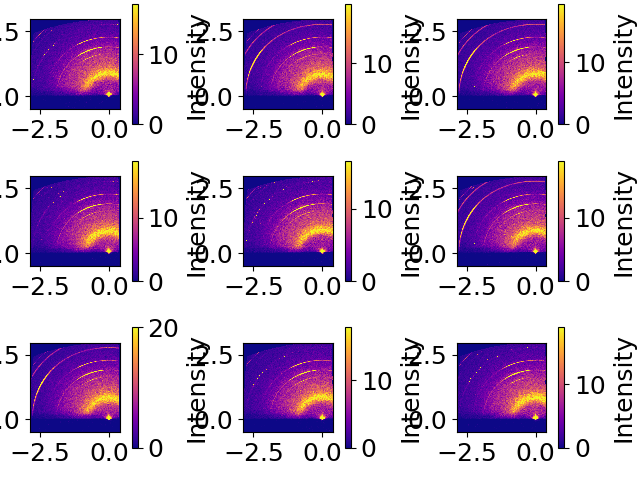

In [6]:
nx_files = NexusFile(path_list, do_batch=True)
try:
    # Do some process
    nx_files.process_q_space(save=True, display=False, group_name="DATA_Q_SPACE")
    nx_files.process_display(group_name="DATA_Q_SPACE")
except Exception as error:
    # Do something else if an error occurs
    print(error)
finally:
    nx_files.nexus_close() # Very important !

## Getting more info on a method

You can get a lot of information on a particular method of the NexusFile class by using the show_method method.\
By putting no parameters you only get a list of all the methods available in the class. If you put one of those name in the method it will show more info regarding that particular method :
- The docstring : A description of what the method does and what the parameters of this method do
- Default value : A list of all the parameters and their default value if they have one

In [7]:
nx_files = NexusFile(path_list, do_batch=True)
# Calling show_method without any parameter :
print(nx_files.show_method())

# Calling show method with the name of another method
print(nx_files.show_method("get_raw_data"))
nx_files.nexus_close()


__init__
_detect_variables
_display_data
_stitching
add_file
get_file
get_parameters
get_process_desc
get_raw_data
nexus_close
process_2_param_intensity
process_absolute_intensity
process_azimuthal_average
process_caking
process_delete_data
process_display
process_horizontal_integration
process_q_space
process_radial_average
process_vertical_integration
show_method
Please rerun this function and pass the name of one method as a parameter
to get more information concerning this particular method

get_raw_data
Docstring : 
        Get raw data of the group name. The parameter and intensity are returned as python dict :
            - key : file name
            - value : param | intensity

        Parameters
        ----------
        group_name :
            name of the group that contains the data to extract

        Returns
        -------
        2 dict :
            - The first one contains the parameter
            - The second one contains the intensity

        
    group_name: s

## Viewing what's inside the HDF5 file

Now is the time to check what is in the .h5 file using the function explore_file defined earlier

In [8]:
explore_file(h5py.File(path_list[0]), False, False)

Group : ENTRY
|  Group : COLLECTION
|  Group : DATA
|  Group : DATA_CAKED
|  Group : DATA_Q_SPACE
|  Group : DATA_RAD_AVG
|  Group : INSTRUMENT
|  |  Group : APERTURE
|  |  Group : COLLIMATOR
|  |  Group : DETECTOR
|  |  Group : SOURCE
|  Group : PROCESS
|  Group : PROCESS_CAKED
|  Group : PROCESS_Q_SPACE
|  Group : PROCESS_RAD_AVG
|  Group : Q
|  Group : SAMPLE


## Displaying your data

Nativelly, raw data and some basic processes should be inside groups called DATA_..., which are themselves in a group called ENTRY

If you want to see those datasets you can simply call the display method as we saw earlier.

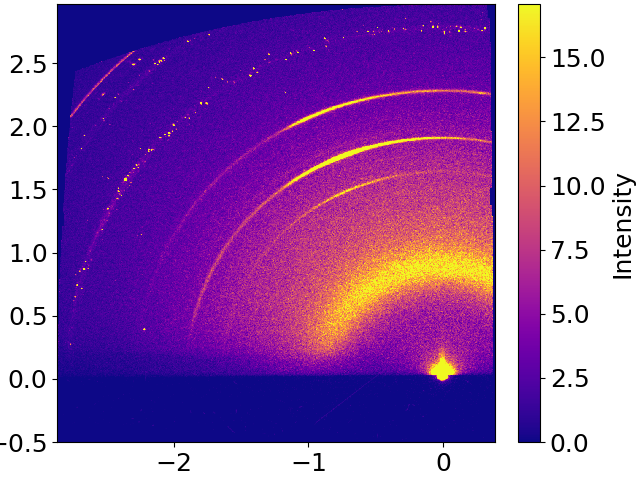

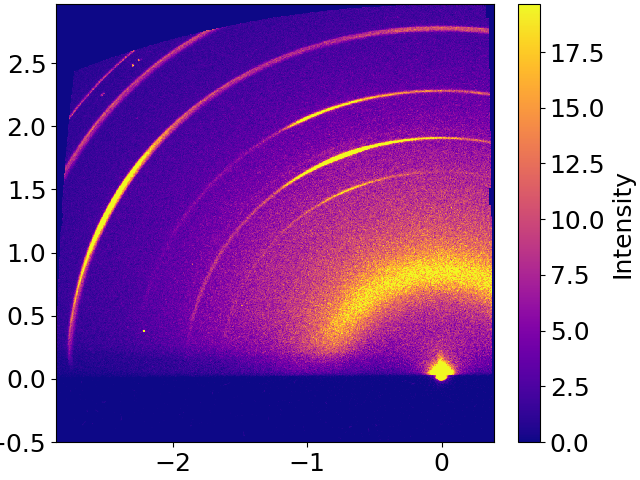

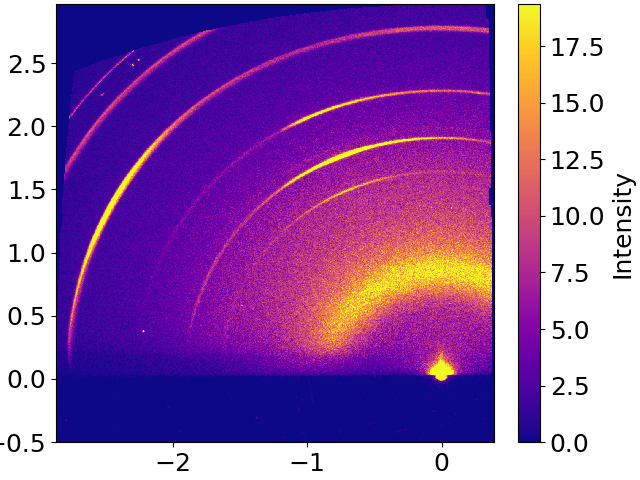

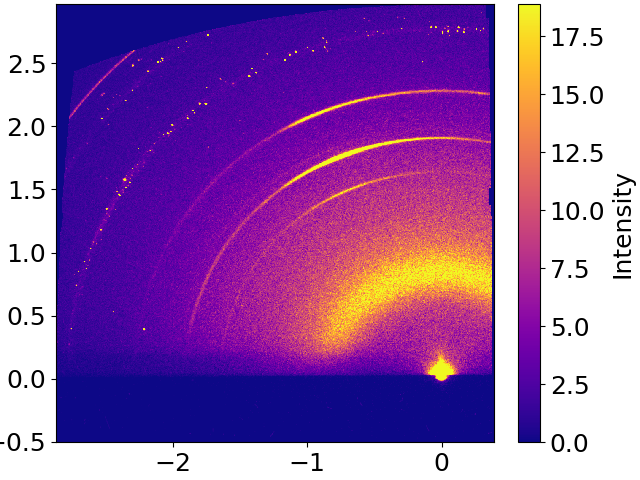

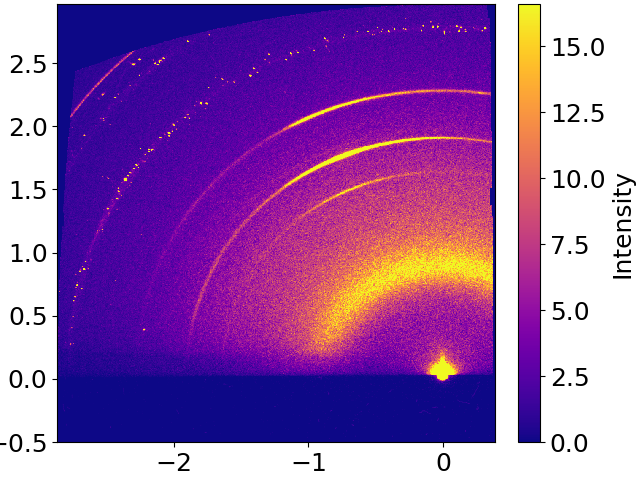

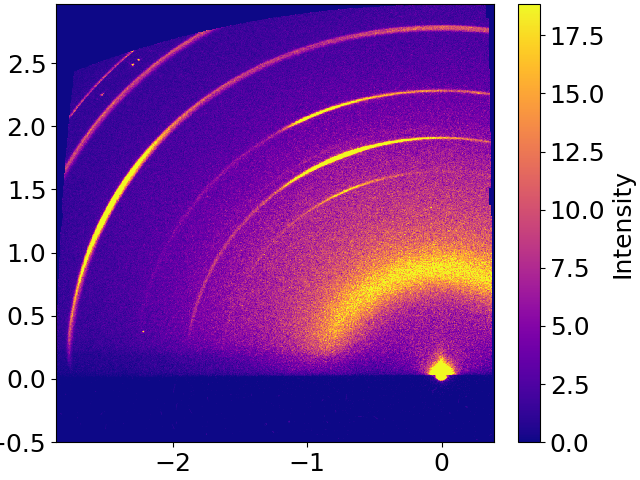

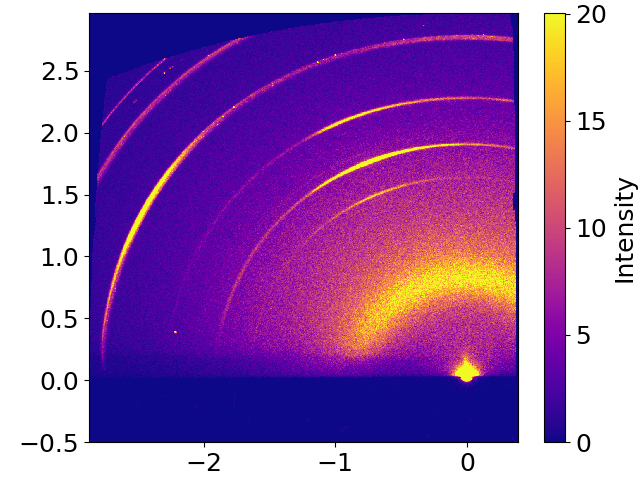

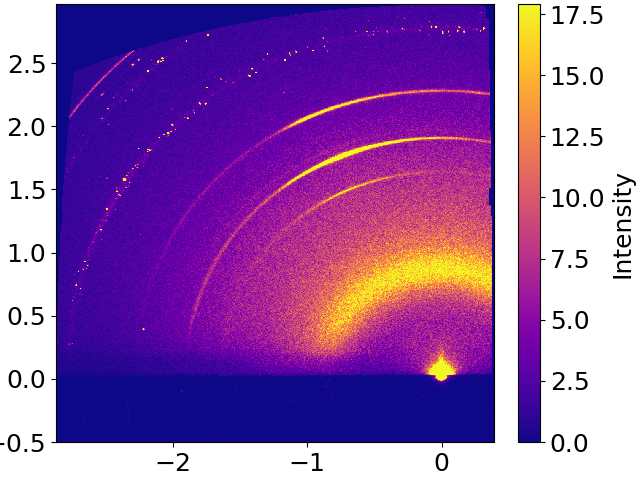

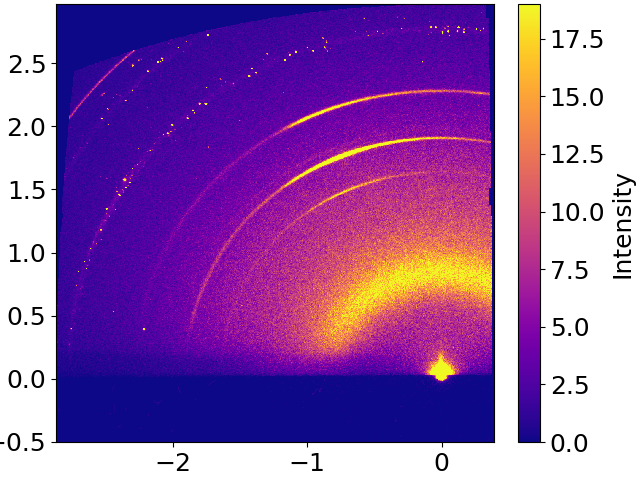

In [9]:
nx_files = NexusFile(path_list, do_batch=False)
try:
    nx_files.process_display(group_name="DATA_Q_SPACE")
except Exception as error:
    print(error)
finally:
    nx_files.nexus_close()

## Applying premade processes

You can do more processes on your data by calling the other methods of the NexusFile class. let's do caking for example.

For most processes, you can display and/or save the processes data to your HDF5 file while keeping the raw data.

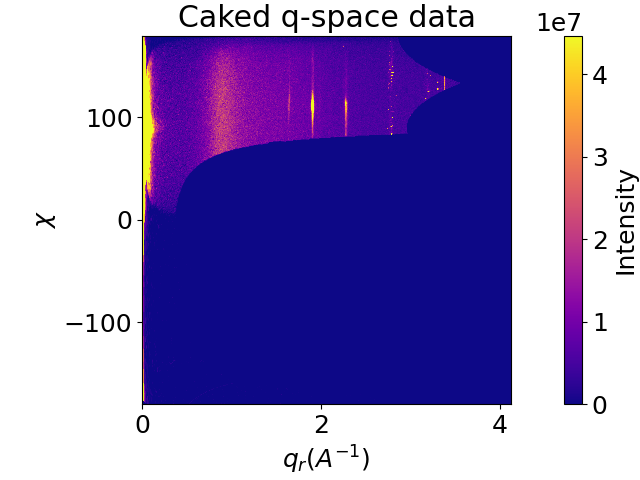

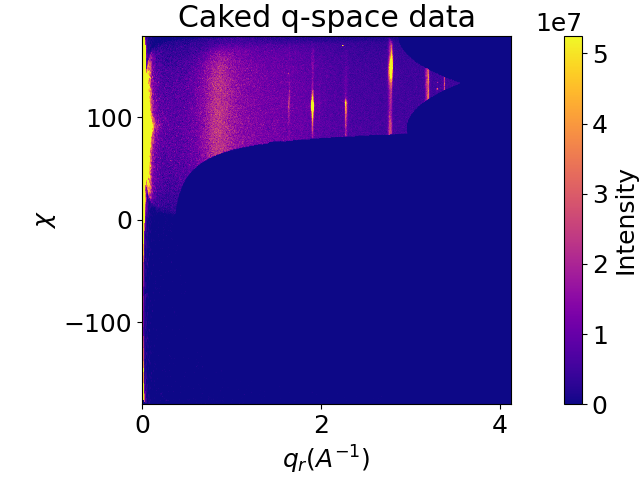

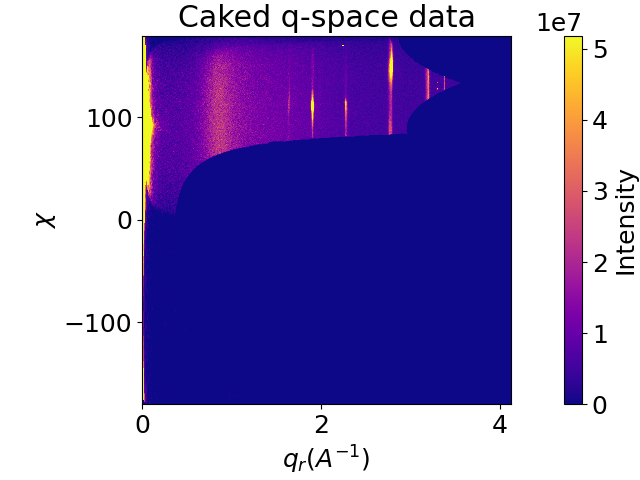

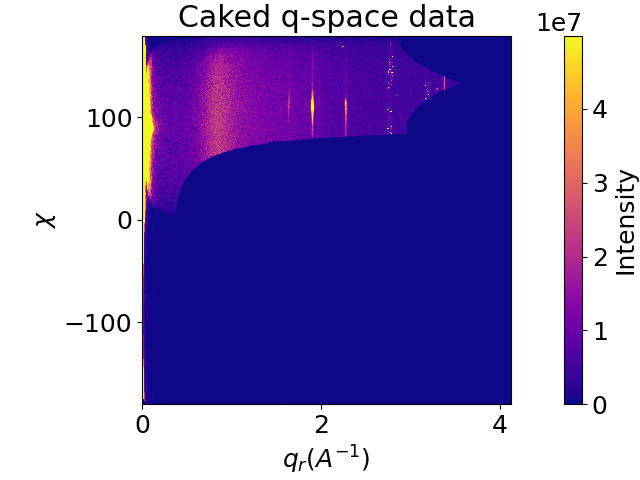

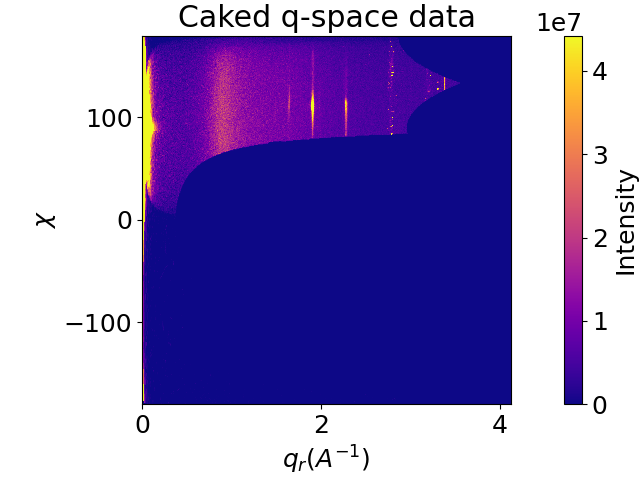

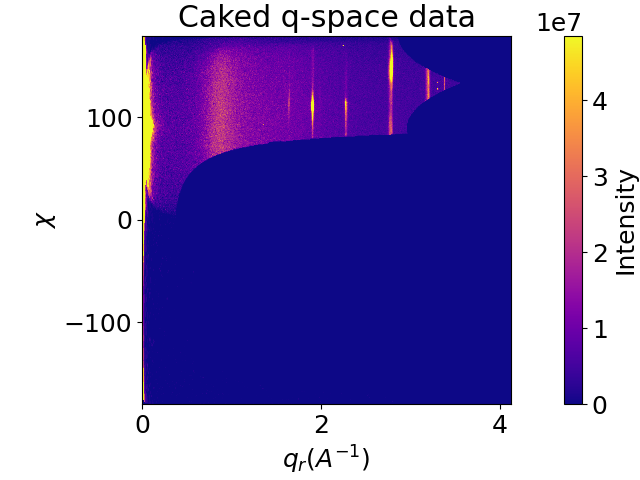

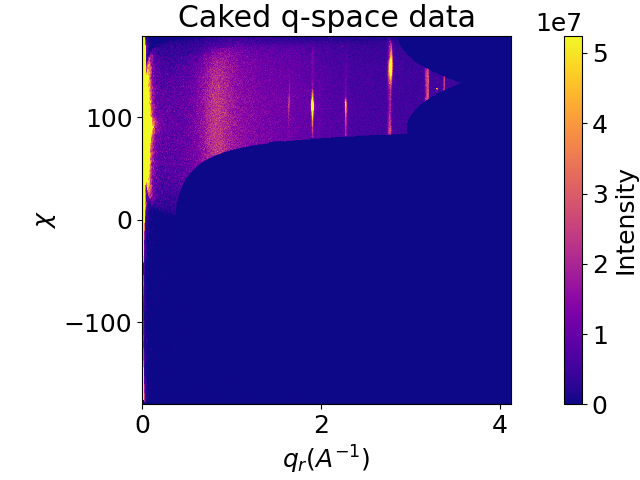

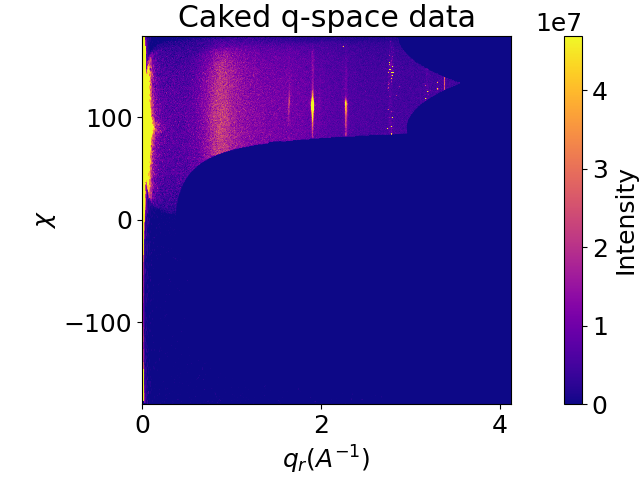

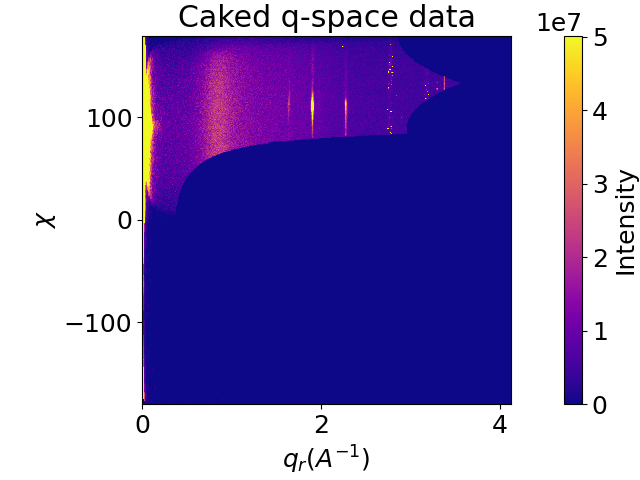

In [10]:
nx_files = NexusFile(path_list, do_batch=False)
try:
    nx_files.process_caking(display=True, save=True, group_name="DATA_CAKED")
except Exception as error:
    print(error)
finally:
    nx_files.nexus_close()

 We can check and see if the data has been saved properly

In [11]:
explore_file(h5py.File(path_list[0]), False, False)

Group : ENTRY
|  Group : COLLECTION
|  Group : DATA
|  Group : DATA_CAKED
|  Group : DATA_Q_SPACE
|  Group : DATA_RAD_AVG
|  Group : INSTRUMENT
|  |  Group : APERTURE
|  |  Group : COLLIMATOR
|  |  Group : DETECTOR
|  |  Group : SOURCE
|  Group : PROCESS
|  Group : PROCESS_CAKED
|  Group : PROCESS_Q_SPACE
|  Group : PROCESS_RAD_AVG
|  Group : Q
|  Group : SAMPLE


As we can see, a new group called DATA_CAKED was created !
There is also an associated PROCESS_CAKED that was created

## Showing what's in PROCESS_...

You can display what's in PROCES_... by using the method get_process_desc. This method return a python dictionnary :
- The key is the name of the file
- The value is the description of the process for that particular file

Each process contains a short description of what is the process and what were the parameters used to get this particular result

In [12]:
nx_files = NexusFile(path_list, do_batch=False)
try:
    desc = nx_files.get_process_desc(group_name="PROCESS_CAKED")
except Exception as error:
    print(error)
finally:
    nx_files.nexus_close()

for key, value in desc.items():
    print(key)
    print(value)

Ech_Al_other_img00312-00313.h5
This process plots the intensity with respect to the azimuthal angle and the distance from the center of the q-space.
Parameters used :
   - Azimuthal range : [-180.0000, 180.0000] with 1000 points
   - Radial Q range : [0.0000, 4.1249] with 1000 points

Ech_Al_other_img00128-00129.h5
This process plots the intensity with respect to the azimuthal angle and the distance from the center of the q-space.
Parameters used :
   - Azimuthal range : [-180.0000, 180.0000] with 1000 points
   - Radial Q range : [0.0000, 4.1248] with 1000 points

Ech_Al_other_img00108-00109.h5
This process plots the intensity with respect to the azimuthal angle and the distance from the center of the q-space.
Parameters used :
   - Azimuthal range : [-180.0000, 180.0000] with 1000 points
   - Radial Q range : [0.0000, 4.1248] with 1000 points

Ech_Al_other_img00216-00217.h5
This process plots the intensity with respect to the azimuthal angle and the distance from the center of the q-

## Getting raw data

Let's say we do the radial average but we would like to get the raw data to do some fitting or some other thing.
You can always get the raw data by using the method get_raw_data.

This method return 2 dictionnary :
- the first one contains the data of the parameter (commonly a list of vector Q)
- The second one contains the data of the measure (commonly a list of intensity)

The key is the name of the file and the value is the data associated to this file

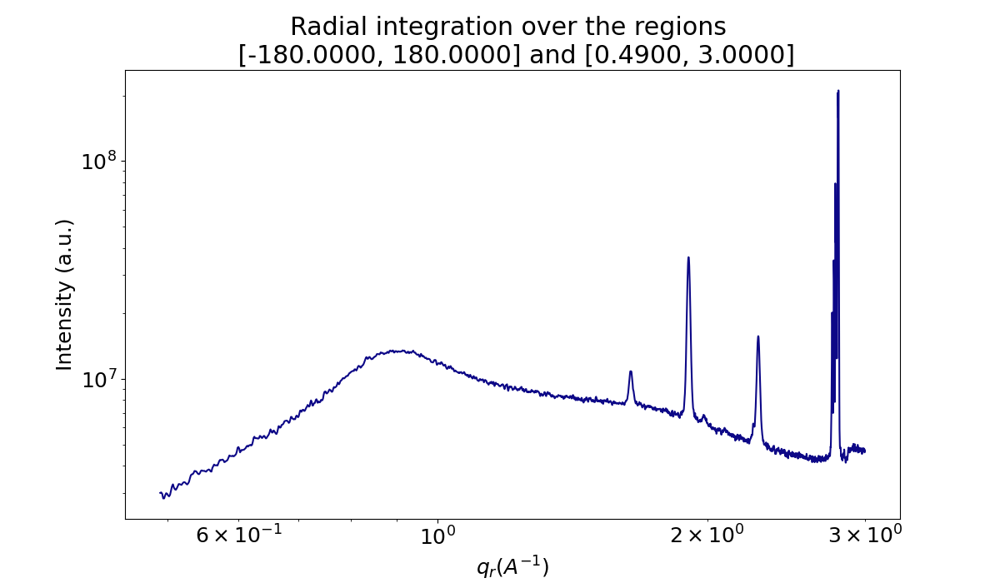

In [13]:
nx_files = NexusFile([path_list[0]], do_batch=False)
try: 
    nx_files.process_radial_average(display=True, save=True, rad_min=0.49, rad_max=3)
    Q_dict, I_dict = nx_files.get_raw_data(group_name="DATA_RAD_AVG")
except Exception as error:
    raise error
finally:
    nx_files.nexus_close()

We plot the data we just got to be sure it's the same

C:\Users\AT280565\AppData\Local\Temp\ipykernel_19664\3206985381.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


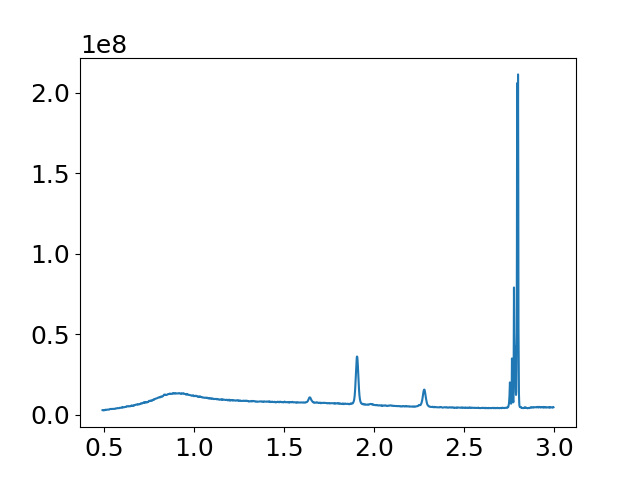

In [14]:
file_path = Path(path_list[0])
file_name = file_path.name
q_file1 = Q_dict[file_name]
i_file1 = I_dict[file_name]

plt.figure()
plt.plot(q_file1, i_file1)
plt.show()

We did get the exact same data

Let's do a Naive normalization process on this data

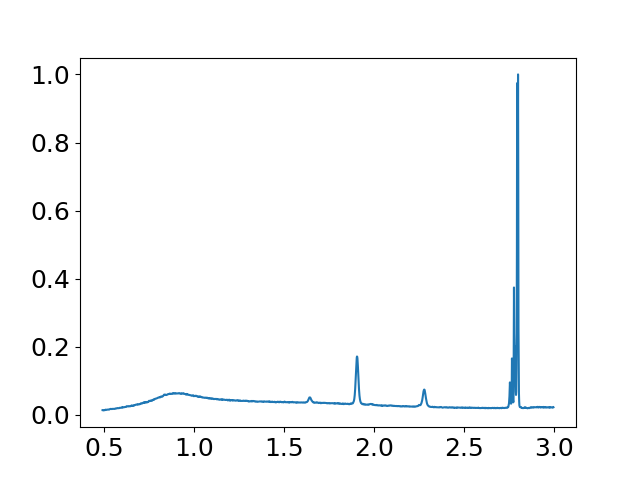

In [15]:
# For example we normalize the data
max_i = np.max(i_file1)
i_file1 = i_file1 / max_i

plt.figure()
plt.plot(q_file1, i_file1)
plt.show()


Now we can save the data to the HDF5 file by using the save_data function from the saxs_nxformat.class_nexus_file script

In [23]:
for file_path in path_list:
    with h5py.File(file_path, "r+") as nx_file:
        save_data(nx_file, "DATA_RAD_AVG_NORM", "Q", q_file1, i_file1, [])

We can check and see if the data has been saved successfully

In [24]:
explore_file(h5py.File(path_list[0]), False, False)

Group : ENTRY
|  Group : COLLECTION
|  Group : DATA
|  Group : DATA_CAKED
|  Group : DATA_Q_SPACE
|  Group : DATA_RAD_AVG
|  Group : DATA_RAD_AVG_NORM
|  Group : INSTRUMENT
|  |  Group : APERTURE
|  |  Group : COLLIMATOR
|  |  Group : DETECTOR
|  |  Group : SOURCE
|  Group : PROCESS
|  Group : PROCESS_CAKED
|  Group : PROCESS_Q_SPACE
|  Group : PROCESS_RAD_AVG
|  Group : Q
|  Group : SAMPLE


We can see the data has been saved, let's display it using the NexusFile method

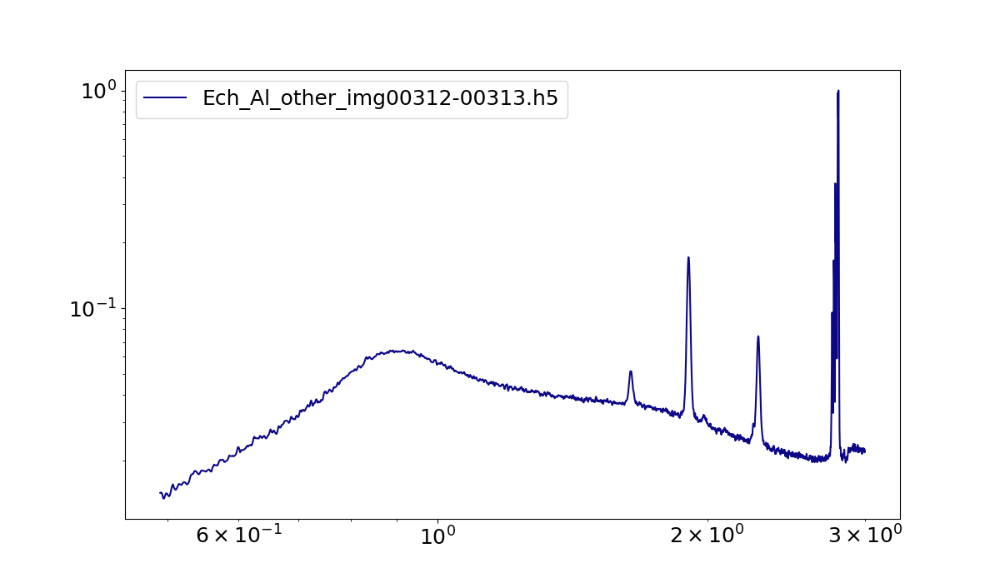

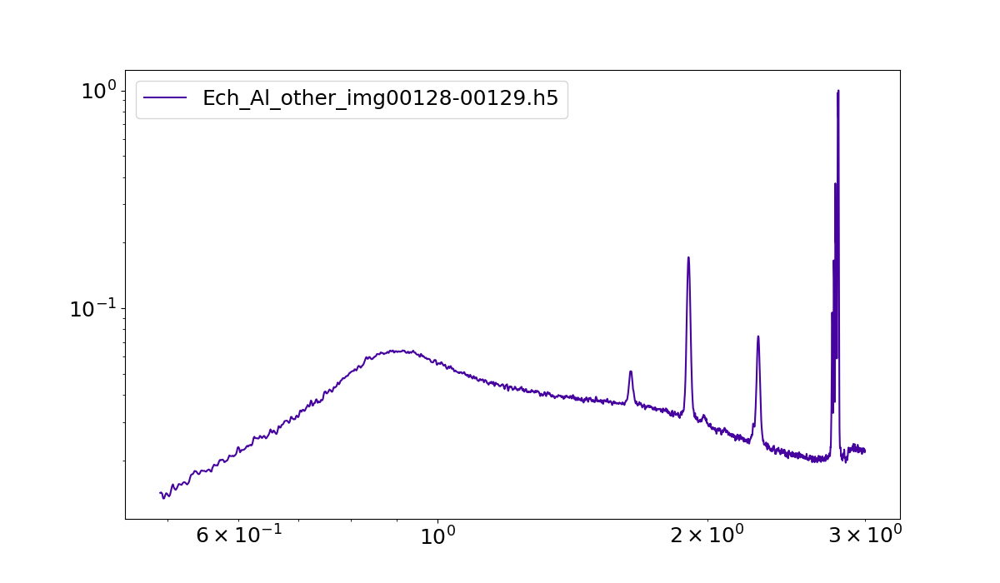

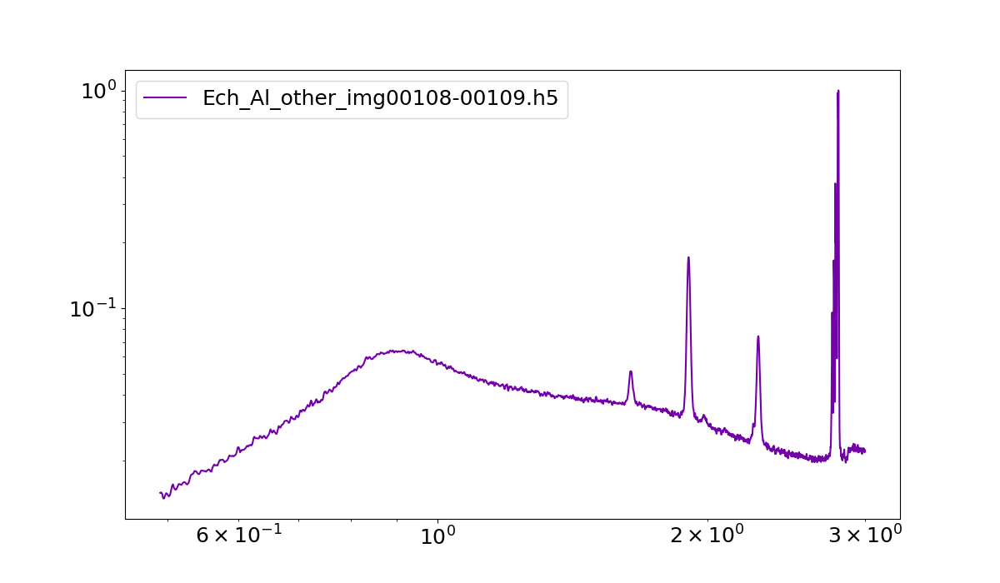

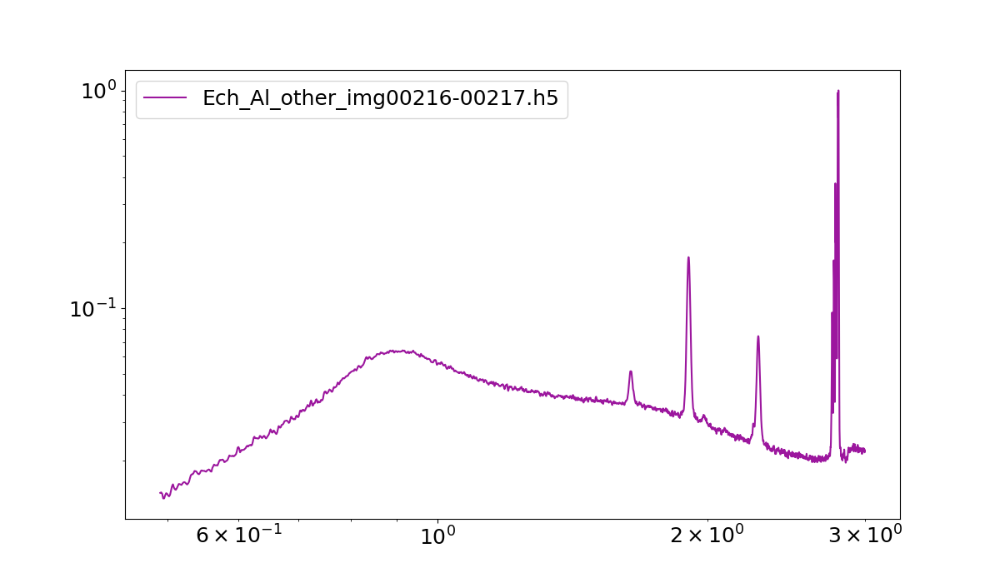

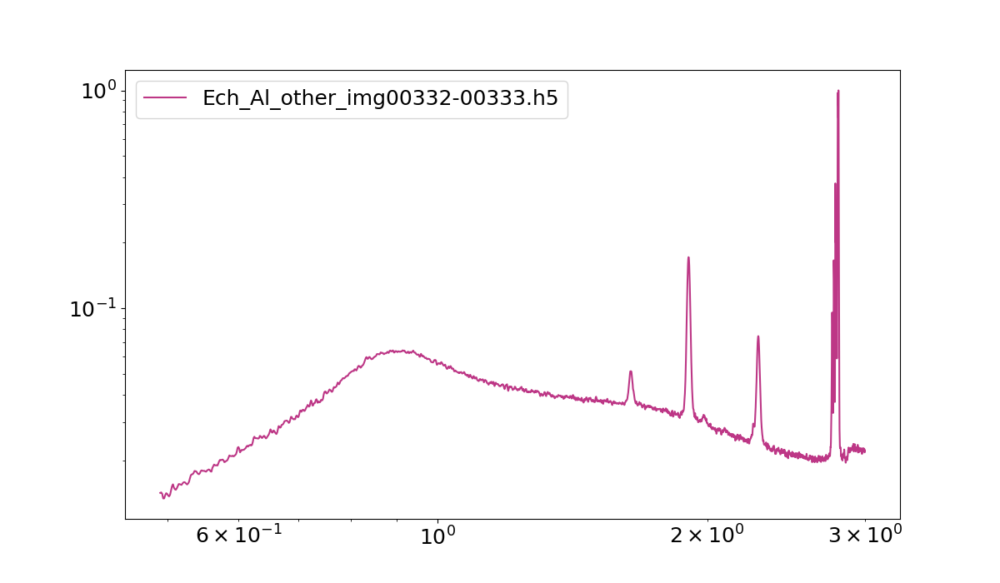

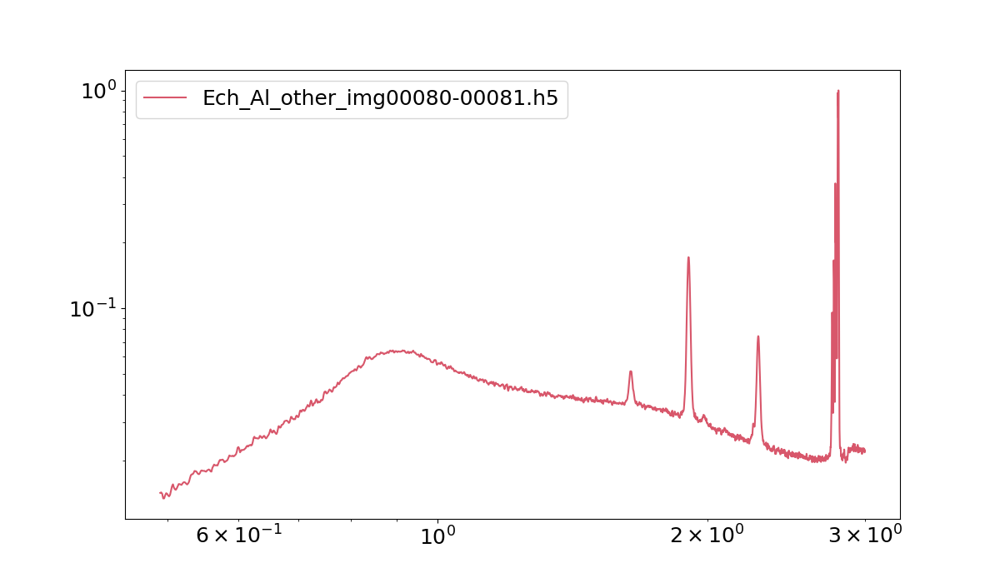

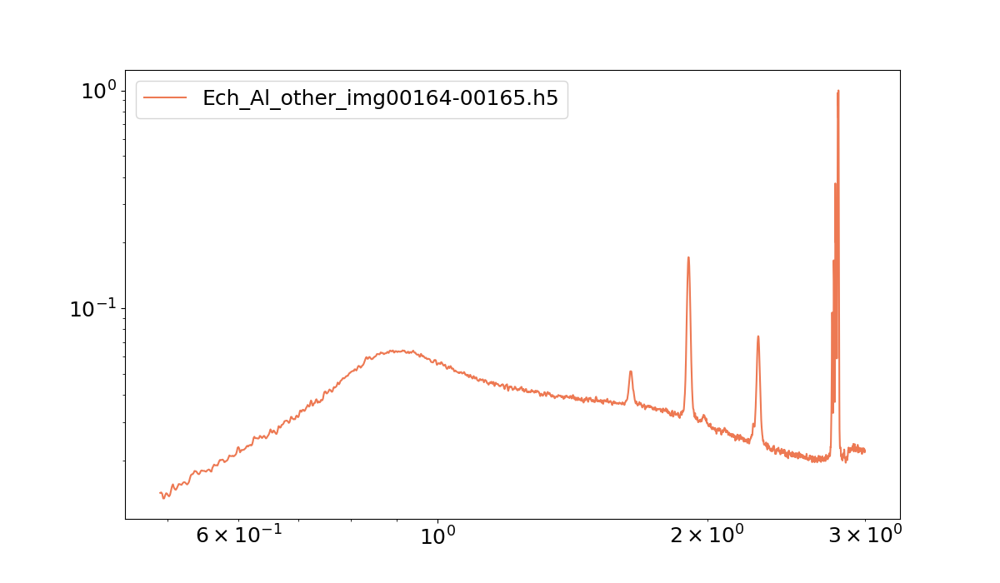

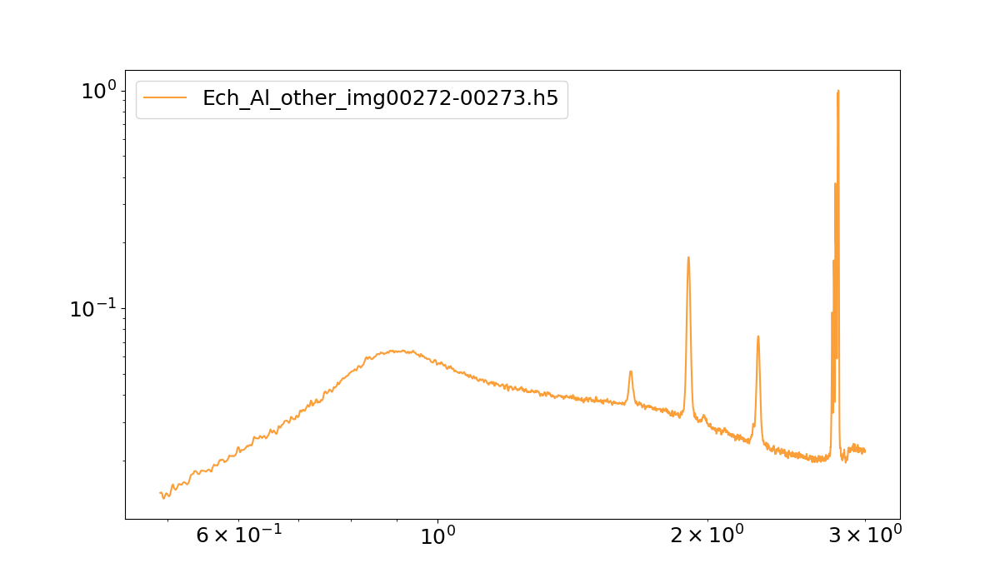

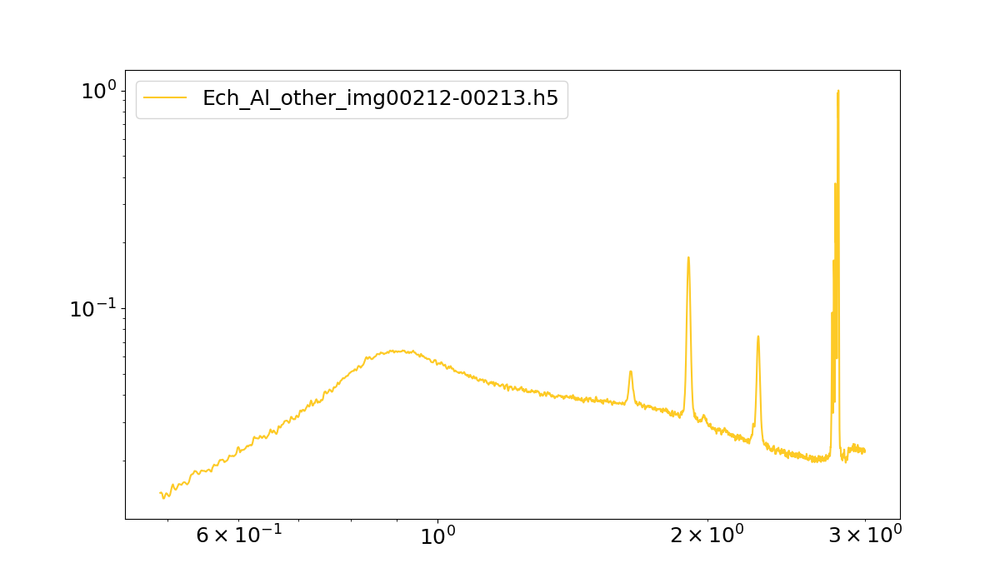

In [25]:
nx_files = NexusFile(path_list, do_batch=False)
try: 
    nx_files.process_display(group_name="DATA_RAD_AVG_NORM")
except Exception as error:
    print(error)
finally:
    nx_files.nexus_close()

# Troubleshooting

1. In case you forgot to use the try: / finally: environement and you're having some error saying a file is already used by a process : Close the notebook and the command invite and go to the directory where your files are, there should be a .tmp file, you can delete it and reopen the notebook. To avoid this error please use the try: / environement: 